<h1>Frequency Domain Steganography</h1>

### Necessary Imports & Declarations

In [2]:
import os
import glob
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
import random
import pandas as pd
#matplotlib inline

from PIL import Image
from torchvision import transforms
from skimage.filters import threshold_otsu

from deepgaze.saliency_map import FasaSaliencyMapping

# Define the directory paths
train_dir = os.path.join("data", "imagenet", "train")
val_dir   = os.path.join("data", "imagenet", "val")

### Preview function to see output of each step.

In [3]:
# train_dir = os.path.join("data", "imagenet", "train")

def get_sample_images(directory, n=10):
    image_paths = glob.glob(os.path.join(directory, '*.*'))
    if len(image_paths) < n:
        return image_paths
    return random.sample(image_paths, n)

sample_image_paths = get_sample_images(train_dir, n=10)
sample_images = []
titles = []

### Load and Preprocess Images

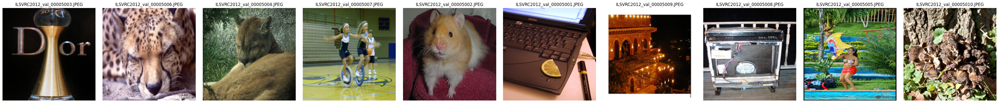

In [4]:
# Load each image, convert to RGB, resize to 224x224, and normalize to [0,1]
for path in sample_image_paths:
    try:
        img = Image.open(path).convert("RGB")
        img = img.resize((224, 224))
        sample_images.append(np.array(img) / 255.0)
        titles.append(os.path.basename(path))
    except Exception as e:
        print(f"Error loading {path}: {e}")

# Display the resized original images horizontally
fig, axes = plt.subplots(1, len(sample_images), figsize=(len(sample_images) * 4, 4))
for ax, img, title in zip(axes, sample_images, titles):
    ax.imshow(img)
    ax.set_title(title)
    ax.axis('off')
plt.tight_layout()
plt.show()

### DeepGaze Saliency Mapping

Processing image 1: shape (224, 224, 3), min 0, max 255
Processing image 2: shape (224, 224, 3), min 1, max 255
Processing image 3: shape (224, 224, 3), min 4, max 244
Processing image 4: shape (224, 224, 3), min 0, max 255
Processing image 5: shape (224, 224, 3), min 1, max 201
Processing image 6: shape (224, 224, 3), min 0, max 255
Processing image 7: shape (224, 224, 3), min 0, max 255
Processing image 8: shape (224, 224, 3), min 0, max 255
Processing image 9: shape (224, 224, 3), min 0, max 255
Processing image 10: shape (224, 224, 3), min 0, max 255


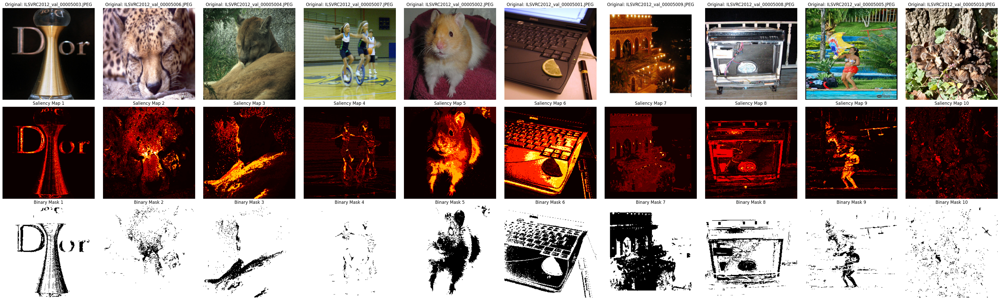

In [5]:
def gen_saliency_maps(images):
    saliency_maps = []
    for idx, img in enumerate(images):
        # Instantiate a new saliency model for each image (avoids caching/state issues)
        saliency = FasaSaliencyMapping(image_h=224, image_w=224)
        # Convert normalized image (0–1) to uint8 (0–255)
        image_uint8 = (img * 255).astype(np.uint8)
        # (Image is already 224×224)
        print(f"Processing image {idx+1}: shape {image_uint8.shape}, min {image_uint8.min()}, max {image_uint8.max()}")
        sal_map = saliency.returnMask(image_uint8, tot_bins=8, format='RGB')
        saliency_maps.append(sal_map)
    return np.array(saliency_maps)

# Generate saliency maps for our sample images
saliency_maps = gen_saliency_maps(sample_images)

# For each saliency map, create a binary mask using Otsu's thresholding and display the results.
binary_masks = []
fig, axes = plt.subplots(3, len(sample_images), figsize=(len(sample_images)*4, 12))
for i, (img, sal_map) in enumerate(zip(sample_images, saliency_maps)):
    # Normalize saliency map to [0,255] for visualization
    sal_map_norm = cv2.normalize(sal_map, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
    thresh_val = threshold_otsu(sal_map_norm)
    binary_mask = (sal_map_norm < thresh_val).astype(np.uint8) * 255
    binary_masks.append(binary_mask)
    
    # Row 0: Original image (resized)
    axes[0, i].imshow(img)
    axes[0, i].set_title(f"Original: {titles[i]}")
    axes[0, i].axis('off')
    # Row 1: Saliency Map
    axes[1, i].imshow(sal_map_norm, cmap='hot')
    axes[1, i].set_title(f"Saliency Map {i+1}")
    axes[1, i].axis('off')
    # Row 2: Binary Mask
    axes[2, i].imshow(binary_mask, cmap='gray')
    axes[2, i].set_title(f"Binary Mask {i+1}")
    axes[2, i].axis('off')
plt.tight_layout()
plt.show()

<h2>Frequency Domain Embedding (DCT)</h2>

### Gnereate the block mask

In [6]:
def compute_block_mask(saliency_map, block_size=16, threshold=0.05):
    """
    Compute a binary mask indicating which blocks are good for embedding
    based on average saliency per block.

    Args:
        saliency_map (numpy array): Grayscale saliency map (HxW), normalized [0,1]
        block_size (int): Block size, default 16
        threshold (float): Saliency threshold

    Returns:
        mask (numpy array): Binary mask (h_blocks x w_blocks), 1=good for embedding, 0=skip
    """
    h, w = saliency_map.shape
    h_blocks = h // block_size
    w_blocks = w // block_size

    mask = np.zeros((h_blocks, w_blocks), dtype=np.uint8)

    for i in range(h_blocks):
        for j in range(w_blocks):
            y_start = i * block_size
            x_start = j * block_size
            block = saliency_map[y_start:y_start + block_size, x_start:x_start + block_size]
            avg_saliency = np.mean(block)

            if avg_saliency < threshold:
                mask[i, j] = 1  # Good block for embedding

    return mask


### Overlay the Mask on the Image

In [7]:
def overlay_blocks_on_image(image, block_mask, block_size=16):
    """
    Overlay green/red rectangles on the original image based on the block mask.

    Args:
        image (numpy array): Original RGB image (HxWx3), uint8
        block_mask (numpy array): Binary block mask (h_blocks x w_blocks)
        block_size (int): Block size, default 16

    Returns:
        overlay_img (numpy array): Image with green/red block overlays
    """
    overlay_img = image.copy()
    h_blocks, w_blocks = block_mask.shape

    for i in range(h_blocks):
        for j in range(w_blocks):
            y_start = i * block_size
            x_start = j * block_size

            if block_mask[i, j] == 1:
                color = (0, 255, 0)  # Green for good block
            else:
                color = (255, 0, 0)  # Red for skip block

            # Draw rectangle
            cv2.rectangle(
                overlay_img,
                (x_start, y_start),
                (x_start + block_size - 1, y_start + block_size - 1),
                color,
                1
            )

    return overlay_img


### Display Saliency Maps and Block Overlays

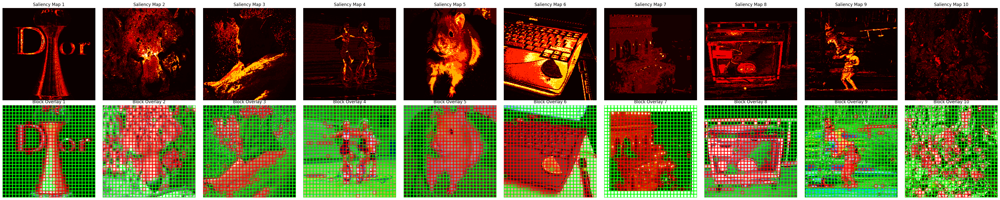

Image 1: Total Blocks = 784, Good Blocks = 591, Bad Blocks = 193
Image 2: Total Blocks = 784, Good Blocks = 414, Bad Blocks = 370
Image 3: Total Blocks = 784, Good Blocks = 529, Bad Blocks = 255
Image 4: Total Blocks = 784, Good Blocks = 628, Bad Blocks = 156
Image 5: Total Blocks = 784, Good Blocks = 475, Bad Blocks = 309
Image 6: Total Blocks = 784, Good Blocks = 307, Bad Blocks = 477
Image 7: Total Blocks = 784, Good Blocks = 453, Bad Blocks = 331
Image 8: Total Blocks = 784, Good Blocks = 406, Bad Blocks = 378
Image 9: Total Blocks = 784, Good Blocks = 627, Bad Blocks = 157
Image 10: Total Blocks = 784, Good Blocks = 603, Bad Blocks = 181


In [9]:
import matplotlib.pyplot as plt

def display_saliency_and_overlay(saliency_maps, overlay_images, titles=None):
    """
    Display saliency maps and overlay images in two rows:
    - Row 0: Saliency maps (hot colormap)
    - Row 1: Overlay images with green/red blocks

    Args:
        saliency_maps (list): List of saliency maps (HxW), normalized [0,1] or [0,255]
        overlay_images (list): List of overlay images (HxWx3), uint8
        titles (list): Optional list of titles for each image
    """
    num_images = len(saliency_maps)
    fig, axes = plt.subplots(2, num_images, figsize=(num_images * 4, 8))

    for i in range(num_images):
        sal_map = saliency_maps[i]
        overlay_img = overlay_images[i]

        # Normalize saliency map for display
        if sal_map.max() <= 1.0:
            sal_map_vis = (sal_map * 255).astype(np.uint8)
        else:
            sal_map_vis = sal_map.astype(np.uint8)

        # Saliency map
        axes[0, i].imshow(sal_map_vis, cmap='hot')
        axes[0, i].set_title(f"Saliency Map {i+1}" if not titles else titles[i])
        axes[0, i].axis('off')

        # Overlay image
        axes[1, i].imshow(overlay_img)
        axes[1, i].set_title(f"Block Overlay {i+1}" if not titles else titles[i])
        axes[1, i].axis('off')

    plt.tight_layout()
    plt.show()


# Parameters
block_size = 8 #Changed to 8 after 16
threshold = 0.05

# Containers for masks and overlay images
block_masks = []
overlay_images = []

# Process each image and saliency map
for img, sal_map in zip(sample_images, saliency_maps):
    # Ensure image is uint8
    img_uint8 = (img * 255).astype(np.uint8) if img.max() <= 1.0 else img

    # Normalize saliency map if necessary
    sal_map_norm = sal_map / 255.0 if sal_map.max() > 1.0 else sal_map

    # Step 1: Compute block mask
    block_mask = compute_block_mask(sal_map_norm, block_size, threshold)
    block_masks.append(block_mask)

    # Step 2: Overlay block mask on image
    overlay_img = overlay_blocks_on_image(img_uint8, block_mask, block_size)
    overlay_images.append(overlay_img)

# Step 3: Display results
display_saliency_and_overlay(saliency_maps, overlay_images)

# Calculate and display block statistics for all images
for idx, block_mask in enumerate(block_masks):
    total_blocks = block_mask.size
    good_blocks = np.sum(block_mask == 1)
    bad_blocks = total_blocks - good_blocks

    print(f"Image {idx+1}: Total Blocks = {total_blocks}, Good Blocks = {good_blocks}, Bad Blocks = {bad_blocks}")

### Calculate Capacity

In [10]:
def calculate_embedding_capacity(block_mask, bits_per_block=4):
    """
    Calculate embedding capacity based on block mask and bits per block.
    
    Args:
        block_mask (numpy array): Binary mask of blocks (h_blocks x w_blocks)
        bits_per_block (int): Number of bits you can embed per block (default: 4)
    
    Returns:
        total_bits (int): Total embedding capacity in bits
    """
    num_good_blocks = np.sum(block_mask == 1)
    total_bits = num_good_blocks * bits_per_block
    print(f"Embedding capacity: {total_bits} bits ({num_good_blocks} blocks x {bits_per_block} bits/block)")
    return total_bits



### Generate Random Payload Bits

In [11]:
def generate_random_payload(num_bits):
    """
    Generate a random payload as a bitstream.
    
    Args:
        num_bits (int): Number of bits to generate
    
    Returns:
        payload_bits (numpy array): Array of 0s and 1s
    """
    payload_bits = np.random.randint(0, 2, size=num_bits, dtype=np.uint8)
    print(f"Generated random payload of {num_bits} bits.")
    return payload_bits


### Convert String Message to Bits

In [12]:
def string_to_bits(message):
    """
    Convert a string message to a bitstream (list of 0s and 1s).
    
    Args:
        message (str): Text message to convert
    
    Returns:
        payload_bits (numpy array): Bitstream of the message
    """
    byte_array = bytearray(message, 'utf-8')
    bits = []
    for byte in byte_array:
        bits.extend([int(bit) for bit in format(byte, '08b')])
    
    payload_bits = np.array(bits, dtype=np.uint8)
    print(f"Converted message '{message}' to {len(payload_bits)} bits.")
    return payload_bits


In [13]:
# Assume you already have block_masks from earlier

# Step 1: Calculate capacity for each image
bits_per_block = 4  # Or adjust based on your DCT embedding plan
capacities = [calculate_embedding_capacity(block_mask, bits_per_block=bits_per_block) for block_mask in block_masks]

# Step 2a: Generate random payloads for each image
# random_payloads = [generate_random_payload(capacity) for capacity in capacities]

# Optional Step 2b: Convert string message to bits (if you want)
message = "War Eagle!"
# The quick brown fox jumps over the lazy dog!
message_payload = string_to_bits(message)

# Ensure message payload fits for each image
# payloads = []
# for capacity in capacities:
#     if len(message_payload) > capacity:
#         print("Message is too big! Trimming it to fit.")
#         payload = message_payload[:capacity]
#     else:
#         payload = message_payload
#     payloads.append(payload)

payloads = []
for i, capacity in enumerate(capacities):
    if len(message_payload) <= capacity:
        print(f"Message fits for image {i}, using your message!")
        payload = message_payload
    else:
        print(f"Message too big for image {i}, using random bits instead.")
        payload = generate_random_payload(capacity)
    payloads.append(payload)

for i, payload in enumerate(payloads):
    print(f'Payload for image {i}: {payload}')
# Now you have payload bits ready to embed for each image!


Embedding capacity: 2364 bits (591 blocks x 4 bits/block)
Embedding capacity: 1656 bits (414 blocks x 4 bits/block)
Embedding capacity: 2116 bits (529 blocks x 4 bits/block)
Embedding capacity: 2512 bits (628 blocks x 4 bits/block)
Embedding capacity: 1900 bits (475 blocks x 4 bits/block)
Embedding capacity: 1228 bits (307 blocks x 4 bits/block)
Embedding capacity: 1812 bits (453 blocks x 4 bits/block)
Embedding capacity: 1624 bits (406 blocks x 4 bits/block)
Embedding capacity: 2508 bits (627 blocks x 4 bits/block)
Embedding capacity: 2412 bits (603 blocks x 4 bits/block)
Converted message 'War Eagle!' to 80 bits.
Message fits for image 0, using your message!
Message fits for image 1, using your message!
Message fits for image 2, using your message!
Message fits for image 3, using your message!
Message fits for image 4, using your message!
Message fits for image 5, using your message!
Message fits for image 6, using your message!
Message fits for image 7, using your message!
Message f

## STEP 6 - Qunatization tables for luminance and chrominance

### Extract JPEG Quantization Tables (QnT)

In [14]:
def extract_quantization_tables(image_paths):
    """
    Extract JPEG quantization tables from image files.

    Args:
        image_paths (list): List of file paths to images.

    Returns:
        qtables_list (list): List of quantization tables for each image.
    """
    qtables_list = []

    for idx, img_path in enumerate(image_paths):
        try:
            img = Image.open(img_path)

            # Check if it's JPEG
            if img.format != 'JPEG':
                print(f"[{idx+1}] {os.path.basename(img_path)} is not a JPEG image. Skipping.")
                qtables_list.append(None)
                continue

            qtables = img.quantization
            qtables_list.append(qtables)

            print(f"[{idx+1}] Extracted quantization tables from {os.path.basename(img_path)}")

        except Exception as e:
            print(f"[{idx+1}] Error processing {img_path}: {e}")
            qtables_list.append(None)

    return qtables_list

# Run it on your sample image paths
qtables_list = extract_quantization_tables(sample_image_paths)

[1] Extracted quantization tables from ILSVRC2012_val_00005003.JPEG
[2] Extracted quantization tables from ILSVRC2012_val_00005006.JPEG
[3] Extracted quantization tables from ILSVRC2012_val_00005004.JPEG
[4] Extracted quantization tables from ILSVRC2012_val_00005007.JPEG
[5] Extracted quantization tables from ILSVRC2012_val_00005002.JPEG
[6] Extracted quantization tables from ILSVRC2012_val_00005001.JPEG
[7] Extracted quantization tables from ILSVRC2012_val_00005009.JPEG
[8] Extracted quantization tables from ILSVRC2012_val_00005008.JPEG
[9] Extracted quantization tables from ILSVRC2012_val_00005005.JPEG
[10] Extracted quantization tables from ILSVRC2012_val_00005010.JPEG


Visualize the QnT Tables (for Understanding)

In [15]:
def display_quantization_tables(qtables_list, image_titles):
    """
    Display quantization tables for each image in a readable format.

    Args:
        qtables_list (list): List of quantization tables.
        image_titles (list): Corresponding titles or filenames.
    """
    for idx, qtables in enumerate(qtables_list):
        print(f"\n=== Quantization Tables for Image {idx+1}: {image_titles[idx]} ===")
        
        if qtables is None:
            print("No quantization table extracted.")
            continue

        for table_id, qtable in qtables.items():
            qtable_matrix = np.array(qtable).reshape((8,8))
            
            df = pd.DataFrame(qtable_matrix)
            print(f"\nTable {table_id} ({'Luminance' if table_id == 0 else 'Chrominance'}):")
            display(df)

# Visualize the quantization tables for understanding
display_quantization_tables(qtables_list, titles)


=== Quantization Tables for Image 1: ILSVRC2012_val_00005003.JPEG ===

Table 0 (Luminance):


,0,1,2,3,4,5,6,7
0,1,1,1,1,2,3,4,5
1,1,1,1,2,2,5,5,4
2,1,1,1,2,3,5,6,4
3,1,1,2,2,4,7,6,5
4,1,2,3,4,5,9,8,6
5,2,3,4,5,6,8,9,7
6,4,5,6,7,8,10,10,8
7,6,7,8,8,9,8,8,8



Table 1 (Chrominance):


,0,1,2,3,4,5,6,7
0,1,1,2,4,8,8,8,8
1,1,2,2,5,8,8,8,8
2,2,2,4,8,8,8,8,8
3,4,5,8,8,8,8,8,8
4,8,8,8,8,8,8,8,8
5,8,8,8,8,8,8,8,8
6,8,8,8,8,8,8,8,8
7,8,8,8,8,8,8,8,8



=== Quantization Tables for Image 2: ILSVRC2012_val_00005006.JPEG ===

Table 0 (Luminance):


,0,1,2,3,4,5,6,7
0,3,2,2,3,5,8,10,12
1,2,2,3,4,5,12,12,11
2,3,3,3,5,8,11,14,11
3,3,3,4,6,10,17,16,12
4,4,4,7,11,14,22,21,15
5,5,7,11,13,16,21,23,18
6,10,13,16,17,21,24,24,20
7,14,18,19,20,22,20,21,20



Table 1 (Chrominance):


,0,1,2,3,4,5,6,7
0,3,4,5,9,20,20,20,20
1,4,4,5,13,20,20,20,20
2,5,5,11,20,20,20,20,20
3,9,13,20,20,20,20,20,20
4,20,20,20,20,20,20,20,20
5,20,20,20,20,20,20,20,20
6,20,20,20,20,20,20,20,20
7,20,20,20,20,20,20,20,20



=== Quantization Tables for Image 3: ILSVRC2012_val_00005004.JPEG ===

Table 0 (Luminance):


,0,1,2,3,4,5,6,7
0,1,1,1,1,2,3,4,5
1,1,1,1,2,2,5,5,4
2,1,1,1,2,3,5,6,4
3,1,1,2,2,4,7,6,5
4,1,2,3,4,5,9,8,6
5,2,3,4,5,6,8,9,7
6,4,5,6,7,8,10,10,8
7,6,7,8,8,9,8,8,8



Table 1 (Chrominance):


,0,1,2,3,4,5,6,7
0,1,1,2,4,8,8,8,8
1,1,2,2,5,8,8,8,8
2,2,2,4,8,8,8,8,8
3,4,5,8,8,8,8,8,8
4,8,8,8,8,8,8,8,8
5,8,8,8,8,8,8,8,8
6,8,8,8,8,8,8,8,8
7,8,8,8,8,8,8,8,8



=== Quantization Tables for Image 4: ILSVRC2012_val_00005007.JPEG ===

Table 0 (Luminance):


,0,1,2,3,4,5,6,7
0,1,1,1,1,2,3,4,5
1,1,1,1,2,2,5,5,4
2,1,1,1,2,3,5,6,4
3,1,1,2,2,4,7,6,5
4,1,2,3,4,5,9,8,6
5,2,3,4,5,6,8,9,7
6,4,5,6,7,8,10,10,8
7,6,7,8,8,9,8,8,8



Table 1 (Chrominance):


,0,1,2,3,4,5,6,7
0,1,1,2,4,8,8,8,8
1,1,2,2,5,8,8,8,8
2,2,2,4,8,8,8,8,8
3,4,5,8,8,8,8,8,8
4,8,8,8,8,8,8,8,8
5,8,8,8,8,8,8,8,8
6,8,8,8,8,8,8,8,8
7,8,8,8,8,8,8,8,8



=== Quantization Tables for Image 5: ILSVRC2012_val_00005002.JPEG ===

Table 0 (Luminance):


,0,1,2,3,4,5,6,7
0,1,1,1,1,2,3,4,5
1,1,1,1,2,2,5,5,4
2,1,1,1,2,3,5,6,4
3,1,1,2,2,4,7,6,5
4,1,2,3,4,5,9,8,6
5,2,3,4,5,6,8,9,7
6,4,5,6,7,8,10,10,8
7,6,7,8,8,9,8,8,8



Table 1 (Chrominance):


,0,1,2,3,4,5,6,7
0,1,1,2,4,8,8,8,8
1,1,2,2,5,8,8,8,8
2,2,2,4,8,8,8,8,8
3,4,5,8,8,8,8,8,8
4,8,8,8,8,8,8,8,8
5,8,8,8,8,8,8,8,8
6,8,8,8,8,8,8,8,8
7,8,8,8,8,8,8,8,8



=== Quantization Tables for Image 6: ILSVRC2012_val_00005001.JPEG ===

Table 0 (Luminance):


,0,1,2,3,4,5,6,7
0,1,1,1,1,2,3,4,5
1,1,1,1,2,2,5,5,4
2,1,1,1,2,3,5,6,4
3,1,1,2,2,4,7,6,5
4,1,2,3,4,5,9,8,6
5,2,3,4,5,6,8,9,7
6,4,5,6,7,8,10,10,8
7,6,7,8,8,9,8,8,8



Table 1 (Chrominance):


,0,1,2,3,4,5,6,7
0,1,1,2,4,8,8,8,8
1,1,2,2,5,8,8,8,8
2,2,2,4,8,8,8,8,8
3,4,5,8,8,8,8,8,8
4,8,8,8,8,8,8,8,8
5,8,8,8,8,8,8,8,8
6,8,8,8,8,8,8,8,8
7,8,8,8,8,8,8,8,8



=== Quantization Tables for Image 7: ILSVRC2012_val_00005009.JPEG ===

Table 0 (Luminance):


,0,1,2,3,4,5,6,7
0,1,1,1,1,2,3,4,5
1,1,1,1,2,2,5,5,4
2,1,1,1,2,3,5,6,4
3,1,1,2,2,4,7,6,5
4,1,2,3,4,5,9,8,6
5,2,3,4,5,6,8,9,7
6,4,5,6,7,8,10,10,8
7,6,7,8,8,9,8,8,8



Table 1 (Chrominance):


,0,1,2,3,4,5,6,7
0,1,1,2,4,8,8,8,8
1,1,2,2,5,8,8,8,8
2,2,2,4,8,8,8,8,8
3,4,5,8,8,8,8,8,8
4,8,8,8,8,8,8,8,8
5,8,8,8,8,8,8,8,8
6,8,8,8,8,8,8,8,8
7,8,8,8,8,8,8,8,8



=== Quantization Tables for Image 8: ILSVRC2012_val_00005008.JPEG ===

Table 0 (Luminance):


,0,1,2,3,4,5,6,7
0,1,1,1,1,2,3,4,5
1,1,1,1,2,2,5,5,4
2,1,1,1,2,3,5,6,4
3,1,1,2,2,4,7,6,5
4,1,2,3,4,5,9,8,6
5,2,3,4,5,6,8,9,7
6,4,5,6,7,8,10,10,8
7,6,7,8,8,9,8,8,8



Table 1 (Chrominance):


,0,1,2,3,4,5,6,7
0,1,1,2,4,8,8,8,8
1,1,2,2,5,8,8,8,8
2,2,2,4,8,8,8,8,8
3,4,5,8,8,8,8,8,8
4,8,8,8,8,8,8,8,8
5,8,8,8,8,8,8,8,8
6,8,8,8,8,8,8,8,8
7,8,8,8,8,8,8,8,8



=== Quantization Tables for Image 9: ILSVRC2012_val_00005005.JPEG ===

Table 0 (Luminance):


,0,1,2,3,4,5,6,7
0,1,1,1,1,2,3,4,5
1,1,1,1,2,2,5,5,4
2,1,1,1,2,3,5,6,4
3,1,1,2,2,4,7,6,5
4,1,2,3,4,5,9,8,6
5,2,3,4,5,6,8,9,7
6,4,5,6,7,8,10,10,8
7,6,7,8,8,9,8,8,8



Table 1 (Chrominance):


,0,1,2,3,4,5,6,7
0,1,1,2,4,8,8,8,8
1,1,2,2,5,8,8,8,8
2,2,2,4,8,8,8,8,8
3,4,5,8,8,8,8,8,8
4,8,8,8,8,8,8,8,8
5,8,8,8,8,8,8,8,8
6,8,8,8,8,8,8,8,8
7,8,8,8,8,8,8,8,8



=== Quantization Tables for Image 10: ILSVRC2012_val_00005010.JPEG ===

Table 0 (Luminance):


,0,1,2,3,4,5,6,7
0,1,1,1,1,2,3,4,5
1,1,1,1,2,2,5,5,4
2,1,1,1,2,3,5,6,4
3,1,1,2,2,4,7,6,5
4,1,2,3,4,5,9,8,6
5,2,3,4,5,6,8,9,7
6,4,5,6,7,8,10,10,8
7,6,7,8,8,9,8,8,8



Table 1 (Chrominance):


,0,1,2,3,4,5,6,7
0,1,1,2,4,8,8,8,8
1,1,2,2,5,8,8,8,8
2,2,2,4,8,8,8,8,8
3,4,5,8,8,8,8,8,8
4,8,8,8,8,8,8,8,8
5,8,8,8,8,8,8,8,8
6,8,8,8,8,8,8,8,8
7,8,8,8,8,8,8,8,8


## Step 7 - Convert "Good" 16x16 Blocks into DCT Domain
Take each 16x16 "good" block (from your block_masks)
Split it into four 8x8 sub-blocks (because DCT is done in 8x8 blocks)
Perform 2D DCT on each sub-block
Store those DCT coefficients for embedding in the next step


### -  Code Block #1: Helper Function to Perform 2D DCT

In [16]:
# def block_to_dct_blocks(block_16x16):
#     """
#     Split a 16x16 block into four 8x8 sub-blocks and perform DCT on each.
    
#     Args:
#         block_16x16 (numpy array): 16x16x3 block (RGB).
    
#     Returns:
#         dct_blocks (list): List of 4 DCT blocks (each 8x8x3).
#     """
#     dct_blocks = []

#     # Split the 16x16 block into four 8x8 blocks
#     for i in range(2):  # rows
#         for j in range(2):  # columns
#             y_start = i * 8
#             x_start = j * 8

#             sub_block = block_16x16[y_start:y_start+8, x_start:x_start+8, :]

#             # Perform DCT on each channel separately
#             dct_sub_block = np.zeros_like(sub_block, dtype=np.float32)
#             for c in range(3):  # R, G, B channels
#                 dct_sub_block[:, :, c] = cv2.dct(sub_block[:, :, c].astype(np.float32))

#             dct_blocks.append(dct_sub_block)

#     return dct_blocks

def block_to_dct_block(block_8x8):
    """
    Perform DCT on an 8x8 RGB block.

    Args:
        block_8x8 (numpy array): 8x8x3 block (RGB).

    Returns:
        dct_block (numpy array): 8x8x3 DCT-transformed block.
    """
    dct_block = np.zeros_like(block_8x8, dtype=np.float32)

    # Perform DCT on each channel
    for c in range(3):  # R, G, B
        dct_block[:, :, c] = cv2.dct(block_8x8[:, :, c].astype(np.float32))

    return dct_block



### - Code Block #2: Apply to All Images and Good Blocks

In [17]:
# def extract_dct_blocks_from_good_blocks(images, block_masks, block_size=16):
#     """
#     Extract DCT blocks (4x 8x8 sub-blocks) from each good 16x16 block in all images.
    
#     Args:
#         images (list): List of sample images (normalized RGB arrays).
#         block_masks (list): List of block masks (1 = good for embedding).
#         block_size (int): Size of blocks (default 16).
    
#     Returns:
#         dct_blocks_per_image (list): For each image, a list of DCT blocks.
#     """
#     dct_blocks_per_image = []

#     for img_idx, (img, block_mask) in enumerate(zip(images, block_masks)):
#         print(f"\nProcessing image {img_idx+1}/{len(images)}...")
        
#         # Ensure image is in uint8
#         img_uint8 = (img * 255).astype(np.uint8) if img.max() <= 1.0 else img

#         h_blocks, w_blocks = block_mask.shape
#         dct_blocks_for_this_image = []

#         for i in range(h_blocks):
#             for j in range(w_blocks):
#                 if block_mask[i, j] == 1:  # Good block!
#                     y_start = i * block_size
#                     x_start = j * block_size

#                     # Extract the 16x16 block (HxWxC)
#                     block_16x16 = img_uint8[y_start:y_start+block_size, x_start:x_start+block_size, :]

#                     # Get the four 8x8 DCT blocks
#                     dct_blocks = block_to_dct_blocks(block_16x16)

#                     # Append to our list
#                     dct_blocks_for_this_image.append({
#                         "block_position": (i, j),
#                         "dct_blocks": dct_blocks
#                     })

#         print(f"Extracted {len(dct_blocks_for_this_image)} good 16x16 blocks from image {img_idx+1}")
#         dct_blocks_per_image.append(dct_blocks_for_this_image)

#     return dct_blocks_per_image

# # Run it on your images and block masks
# dct_blocks_per_image = extract_dct_blocks_from_good_blocks(sample_images, block_masks)


In [18]:
def extract_dct_blocks_from_good_blocks_8x8(images, block_masks, block_size=8):
    """
    Extract 8x8 DCT blocks from each 'good' block in all images.

    Args:
        images (list): List of sample images (normalized RGB arrays).
        block_masks (list): List of block masks (1 = good for embedding).
        block_size (int): Size of blocks (now 8x8).
    
    Returns:
        dct_blocks_per_image (list): For each image, a list of DCT blocks.
    """
    dct_blocks_per_image = []

    for img_idx, (img, block_mask) in enumerate(zip(images, block_masks)):
        print(f"\nProcessing image {img_idx+1}/{len(images)}...")

        img_uint8 = (img * 255).astype(np.uint8) if img.max() <= 1.0 else img

        h_blocks, w_blocks = block_mask.shape
        dct_blocks_for_this_image = []

        for i in range(h_blocks):
            for j in range(w_blocks):
                if block_mask[i, j] == 1:  # Good block!
                    y_start = i * block_size
                    x_start = j * block_size

                    # Extract 8x8 block (RGB)
                    block_8x8 = img_uint8[y_start:y_start+block_size, x_start:x_start+block_size, :]

                    # Apply DCT
                    dct_block = block_to_dct_block(block_8x8)

                    # Store result
                    dct_blocks_for_this_image.append({
                        "block_position": (i, j),
                        "dct_block": dct_block
                    })

        print(f"Extracted {len(dct_blocks_for_this_image)} good 8x8 blocks from image {img_idx+1}")
        dct_blocks_per_image.append(dct_blocks_for_this_image)

    return dct_blocks_per_image

dct_blocks_per_image = extract_dct_blocks_from_good_blocks_8x8(sample_images, block_masks)



Processing image 1/10...
Extracted 591 good 8x8 blocks from image 1

Processing image 2/10...
Extracted 414 good 8x8 blocks from image 2

Processing image 3/10...
Extracted 529 good 8x8 blocks from image 3

Processing image 4/10...
Extracted 628 good 8x8 blocks from image 4

Processing image 5/10...
Extracted 475 good 8x8 blocks from image 5

Processing image 6/10...
Extracted 307 good 8x8 blocks from image 6

Processing image 7/10...
Extracted 453 good 8x8 blocks from image 7

Processing image 8/10...
Extracted 406 good 8x8 blocks from image 8

Processing image 9/10...
Extracted 627 good 8x8 blocks from image 9

Processing image 10/10...
Extracted 603 good 8x8 blocks from image 10


In [19]:
from skimage.measure import shannon_entropy

def extract_block_features(dct_blocks_info, saliency_map, block_size=8):
    """
    Extract features from 8x8 DCT blocks for ML model.

    Args:
        dct_blocks_info (list): DCT block info with 'block_position' and 'dct_block'
        saliency_map (np.array): Normalized saliency map (HxW)
        block_size (int): Block size (default 8)

    Returns:
        features (list): List of feature dicts (one per block)
    """
    features = []

    for block in dct_blocks_info:
        i, j = block["block_position"]
        dct_block = block["dct_block"]

        y_start = i * block_size
        x_start = j * block_size

        # Raw pixel block (just for entropy)
        block_saliency = saliency_map[y_start:y_start+block_size, x_start:x_start+block_size]
        avg_saliency = np.mean(block_saliency)
        entropy = shannon_entropy(block_saliency)
        
        # Variance of DCT coefficients (mid-mid region)
        mid_dct = dct_block[2:6, 2:6, :]  # central region
        dct_var = np.var(mid_dct)

        features.append({
            "block_row": i,
            "block_col": j,
            "avg_saliency": avg_saliency,
            "entropy": entropy,
            "dct_variance": dct_var
        })

    return features

all_features_per_image = []

for idx, dct_blocks in enumerate(dct_blocks_per_image):
    print(f"Extracting features for Image {idx+1}")
    saliency_map = saliency_maps[idx] / 255.0 if saliency_maps[idx].max() > 1.0 else saliency_maps[idx]
    features = extract_block_features(dct_blocks, saliency_map)
    all_features_per_image.append(features)


Extracting features for Image 1
Extracting features for Image 2
Extracting features for Image 3
Extracting features for Image 4
Extracting features for Image 5
Extracting features for Image 6
Extracting features for Image 7
Extracting features for Image 8
Extracting features for Image 9
Extracting features for Image 10


In [20]:
def label_features_heuristically(features, saliency_thresh=0.05, variance_thresh=10.0):
    """
    Label each feature row as 1 (good) or 0 (bad) using basic heuristics.

    Args:
        features (list of dicts): Output from extract_block_features()
        saliency_thresh (float): Max saliency value considered "good"
        variance_thresh (float): Min DCT variance considered "good"

    Returns:
        labeled_features (list of dicts): Same as input, with added 'label'
    """
    labeled = []

    for f in features:
        label = int(f["avg_saliency"] < saliency_thresh and f["dct_variance"] > variance_thresh)
        f_labeled = f.copy()
        f_labeled["label"] = label
        labeled.append(f_labeled)

    return labeled

labeled_data = []

for features in all_features_per_image:
    labeled = label_features_heuristically(features)
    labeled_data.extend(labeled)  # flat list for training

In [21]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import pandas as pd

# Convert labeled data to DataFrame
df = pd.DataFrame(labeled_data)

# Features & labels
X = df[["avg_saliency", "entropy", "dct_variance"]]
y = df["label"]

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train Random Forest
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Evaluate
y_pred = clf.predict(X_test)
print("📊 Classification Report:")
print(classification_report(y_test, y_pred))
print("🧩 Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))


📊 Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       267
           1       1.00      1.00      1.00       740

    accuracy                           1.00      1007
   macro avg       1.00      1.00      1.00      1007
weighted avg       1.00      1.00      1.00      1007

🧩 Confusion Matrix:
[[267   0]
 [  0 740]]


In [22]:
# def predict_embedding_blocks(model, dct_blocks_info, saliency_map, block_size=8):
#     """
#     Predict good blocks for embedding using trained ML model.

#     Args:
#         model (sklearn classifier): Trained model
#         dct_blocks_info (list): List of 8x8 DCT blocks
#         saliency_map (array): Corresponding saliency map (normalized)

#     Returns:
#         selected_blocks (list): Subset of dct_blocks_info predicted as good
#     """
#     selected_blocks = []

#     for block in dct_blocks_info:
#         i, j = block["block_position"]
#         dct_block = block["dct_block"]

#         y_start = i * block_size
#         x_start = j * block_size
#         block_saliency = saliency_map[y_start:y_start+block_size, x_start:x_start+block_size]
        
#         avg_sal = np.mean(block_saliency)
#         entropy = shannon_entropy(block_saliency)
#         dct_var = np.var(dct_block[2:6, 2:6, :])

#         features = pd.DataFrame([[avg_sal, entropy, dct_var]], columns=["avg_saliency", "entropy", "dct_variance"])
#         prediction = model.predict(features)[0]

#         if prediction == 1:
#             selected_blocks.append(block)

#     return selected_blocks

# # Pick an image index
# idx = 0
# test_dct_blocks = dct_blocks_per_image[idx]
# test_sal_map = saliency_maps[idx] / 255.0 if saliency_maps[idx].max() > 1.0 else saliency_maps[idx]

# ai_selected_blocks = predict_embedding_blocks(clf, test_dct_blocks, test_sal_map)

# print(f"AI selected {len(ai_selected_blocks)} blocks for embedding out of {len(test_dct_blocks)}")


In [23]:
def predict_embedding_blocks_strict(model, dct_blocks_info, saliency_map, block_size=8, min_dct_variance=5.0):
    """
    Predict good blocks for embedding using trained model + post-filtering with DCT variance.

    Args:
        model (sklearn classifier): Trained ML model
        dct_blocks_info (list): List of 8x8 DCT block dicts
        saliency_map (ndarray): Normalized saliency map
        block_size (int): Block size (default 8)
        min_dct_variance (float): Min DCT variance allowed (post-filter)

    Returns:
        selected_blocks (list): AI-predicted + variance-checked blocks
    """
    selected_blocks = []

    for block in dct_blocks_info:
        i, j = block["block_position"]
        dct_block = block["dct_block"]

        y_start = i * block_size
        x_start = j * block_size
        block_saliency = saliency_map[y_start:y_start+block_size, x_start:x_start+block_size]

        avg_sal = np.mean(block_saliency)
        entropy = shannon_entropy(block_saliency)
        dct_var = np.var(dct_block[2:6, 2:6, :])

        # AI Prediction
        features = pd.DataFrame([[avg_sal, entropy, dct_var]], columns=["avg_saliency", "entropy", "dct_variance"])
        prediction = model.predict(features)[0]

        # Post-filter based on DCT variance
        if prediction == 1 and dct_var > min_dct_variance:
            selected_blocks.append(block)

    return selected_blocks

ai_selected_blocks_per_image = []

for idx in range(len(dct_blocks_per_image)):
    print(f"AI selecting blocks for Image {idx+1}")

    dct_blocks = dct_blocks_per_image[idx]
    sal_map = saliency_maps[idx] / 255.0 if saliency_maps[idx].max() > 1.0 else saliency_maps[idx]

    selected_blocks = predict_embedding_blocks_strict(clf, dct_blocks, sal_map)
    ai_selected_blocks_per_image.append(selected_blocks)

    print(f"Selected {len(selected_blocks)} / {len(dct_blocks)} blocks")


AI selecting blocks for Image 1
Selected 116 / 591 blocks
AI selecting blocks for Image 2
Selected 342 / 414 blocks
AI selecting blocks for Image 3
Selected 518 / 529 blocks
AI selecting blocks for Image 4
Selected 609 / 628 blocks
AI selecting blocks for Image 5
Selected 392 / 475 blocks
AI selecting blocks for Image 6
Selected 124 / 307 blocks
AI selecting blocks for Image 7
Selected 140 / 453 blocks
AI selecting blocks for Image 8
Selected 243 / 406 blocks
AI selecting blocks for Image 9
Selected 624 / 627 blocks
AI selecting blocks for Image 10
Selected 598 / 603 blocks


In [24]:
def draw_ai_selected_blocks_on_images(images, ai_selected_blocks_per_image, block_size=8, color=(0, 255, 0)):
    """
    Overlay AI-selected 8x8 blocks on images.

    Args:
        images (list): List of original images (uint8).
        ai_selected_blocks_per_image (list): List of lists of selected blocks per image.
        block_size (int): Size of each block (default 8).
        color (tuple): BGR color for block outlines (default green).
    
    Returns:
        overlay_images (list): Images with blocks drawn.
    """
    overlay_images = []

    for idx, (image, selected_blocks) in enumerate(zip(images, ai_selected_blocks_per_image)):
        img_copy = image.copy()

        for block in selected_blocks:
            i, j = block["block_position"]
            y_start = i * block_size
            x_start = j * block_size
            cv2.rectangle(img_copy, (x_start, y_start), (x_start + block_size, y_start + block_size), color, 1)

        overlay_images.append(img_copy)

    return overlay_images

# Normalize originals to uint8 if needed
originals_uint8 = [(img * 255).astype(np.uint8) if img.max() <= 1.0 else img for img in sample_images]

ai_overlay_images = draw_ai_selected_blocks_on_images(
    images=originals_uint8,
    ai_selected_blocks_per_image=ai_selected_blocks_per_image
)


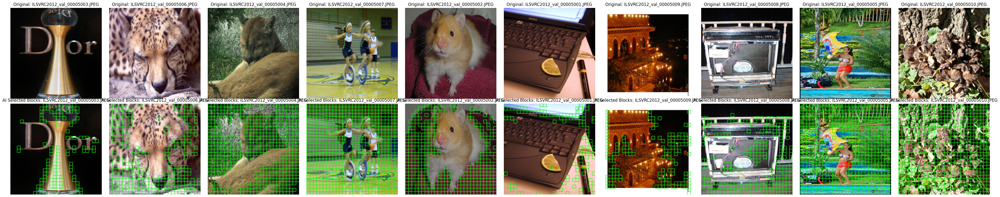

In [26]:
def show_ai_overlay_results(originals, overlays, titles):
    num = len(originals)
    fig, axes = plt.subplots(2, num, figsize=(num * 4, 8))

    if num == 1:
        axes = np.array(axes).reshape(2, 1)

    for i in range(num):
        axes[0, i].imshow(originals[i])
        axes[0, i].set_title(f"Original: {titles[i]}")
        axes[0, i].axis('off')

        axes[1, i].imshow(overlays[i])
        axes[1, i].set_title(f"AI Selected Blocks: {titles[i]}")
        axes[1, i].axis('off')

    plt.tight_layout()
    plt.show()

show_ai_overlay_results(originals_uint8, ai_overlay_images, titles)


### - Sanity Check & Visualize DCT Coefficients

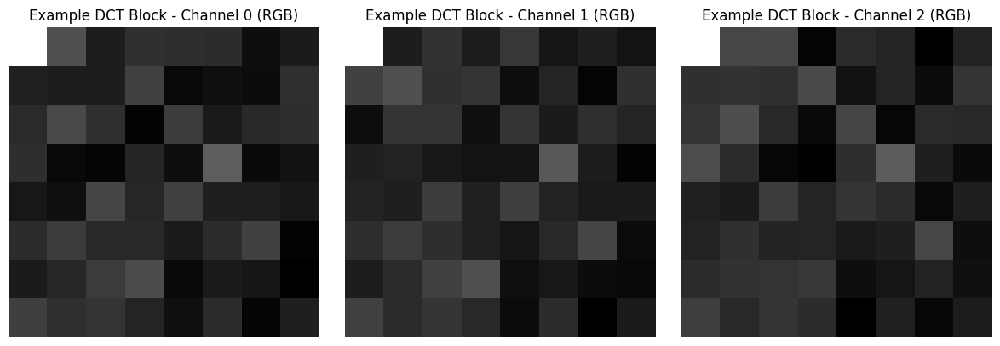

In [27]:
def visualize_dct_block(dct_block, title_prefix="DCT Block"):
    """
    Visualize the magnitude spectrum of a single DCT 8x8 block (RGB channels).
    
    Args:
        dct_block (numpy array): 8x8x3 DCT coefficients.
    """
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))

    for c in range(3):
        # Take absolute value and log scale for visualization
        dct_magnitude = np.log(np.abs(dct_block[:, :, c]) + 1)

        axes[c].imshow(dct_magnitude, cmap='gray')
        axes[c].set_title(f"{title_prefix} - Channel {c} (RGB)")
        axes[c].axis('off')

    plt.tight_layout()
    plt.show()

# Example: Visualize first DCT block of the first image
if dct_blocks_per_image and len(dct_blocks_per_image[0]) > 0:
    example_dct_block = dct_blocks_per_image[0][0]["dct_block"]  # Directly get the 8x8 DCT block
    visualize_dct_block(example_dct_block, title_prefix="Example DCT Block")
else:
    print("No DCT blocks found to visualize.")



## Step 8: Select Mid-Mid DCT Frequencies for Embedding

- From each **8x8 DCT block** inside your good **16x16 blocks**,  
  we select specific **mid-frequency coefficients** to embed your data.

- We'll **adaptively embed**, considering the **QnT values** we extracted earlier (from Step 6).

---

#### **What We’ll Do**

1. Define a list of **mid-mid frequency positions**  
2. For each DCT block, **select those positions**  
3. Apply **QnT-based decision logic**:
    - Skip **low Q** (highly sensitive)  
    - Allow changes in **mid/high Q**  
4. Prepare to **embed bits** in these coefficients in the next step.


### Code Block #1: Define Mid-Mid Frequencies

In [28]:
# Mid-mid frequency positions (Y-axis first)
mid_mid_frequencies = [(3, 3), (2, 3), (3, 2), (4, 1), (1, 4)]

### Code Block #2: Adaptive Embedding Decision Function

In [29]:
def should_embed(q_value, q_threshold_low=4, q_threshold_high=8):
    """
    Decide whether to embed based on quantization value.

    Args:
        q_value (int): Quantization table value at that frequency.
        q_threshold_low (int): Lower threshold (too sensitive to modify).
        q_threshold_high (int): Upper threshold (safe for stronger changes).

    Returns:
        bool: True if we should embed here, False otherwise.
    """
    if q_value <= q_threshold_low:
        return False  # Too sensitive, skip
    elif q_value <= q_threshold_high:
        return True   # Safe for minimal embedding (±1)
    else:
        return True   # Safe for stronger embedding (±1 or ±2)


### Code Block #3: Select Embedding Positions in DCT Blocks


In [30]:
# def select_embedding_positions(dct_blocks_per_image, qtables_list, mid_mid_frequencies):
#     """
#     Select positions in DCT blocks where we can embed data.

#     Args:
#         dct_blocks_per_image (list): Output from Step 7.
#         qtables_list (list): List of quantization tables from Step 6.
#         mid_mid_frequencies (list): List of (row, col) tuples of candidate frequencies.

#     Returns:
#         embedding_candidates_per_image (list): For each image, a list of embedding positions.
#     """
#     embedding_candidates_per_image = []

#     for img_idx, (dct_blocks_info, qtables) in enumerate(zip(dct_blocks_per_image, qtables_list)):
#         print(f"\nSelecting embedding positions for Image {img_idx+1}")

#         if qtables is None:
#             print("No QnT found for this image. Skipping.")
#             embedding_candidates_per_image.append([])
#             continue

#         # Assume luminance Q-table (Table 0) for now
#         qtable = np.array(qtables[0]).reshape((8, 8))
#         candidates_for_image = []

#         for block_info in dct_blocks_info:
#             block_position = block_info['block_position']
#             dct_blocks = block_info['dct_blocks']

#             candidates_for_block = []

#             # Iterate over 4 sub-blocks (each 8x8)
#             for subblock_idx, dct_block in enumerate(dct_blocks):
#                 candidates_for_subblock = []

#                 for (y, x) in mid_mid_frequencies:
#                     q_value = qtable[y, x]

#                     if should_embed(q_value):
#                         candidates_for_subblock.append({
#                             "subblock_idx": subblock_idx,
#                             "freq": (y, x),
#                             "q_value": q_value
#                         })

#                 if candidates_for_subblock:
#                     candidates_for_block.append({
#                         "block_position": block_position,
#                         "subblock_idx": subblock_idx,
#                         "candidates": candidates_for_subblock
#                     })

#             if candidates_for_block:
#                 candidates_for_image.append(candidates_for_block)

#         print(f"Found {len(candidates_for_image)} blocks with embedding opportunities in Image {img_idx+1}")
#         embedding_candidates_per_image.append(candidates_for_image)

#     return embedding_candidates_per_image

# # Run the candidate selection
# embedding_candidates_per_image = select_embedding_positions(
#     dct_blocks_per_image,
#     qtables_list,
#     mid_mid_frequencies
# )


In [31]:
def select_embedding_positions_8x8(dct_blocks_per_image, qtables_list, mid_mid_frequencies):
    """
    Select positions in 8x8 DCT blocks where we can embed data.

    Args:
        dct_blocks_per_image (list): List of DCT blocks per image (after 8x8 processing).
        qtables_list (list): Quantization tables (one per image).
        mid_mid_frequencies (list): (y, x) tuples indicating DCT frequencies to consider.

    Returns:
        embedding_candidates_per_image (list): For each image, list of embedding positions.
    """
    embedding_candidates_per_image = []

    for img_idx, (dct_blocks_info, qtables) in enumerate(zip(dct_blocks_per_image, qtables_list)):
        print(f"\nSelecting embedding positions for Image {img_idx+1}")

        if qtables is None:
            print("No Q-table found. Skipping.")
            embedding_candidates_per_image.append([])
            continue

        qtable = np.array(qtables[0]).reshape((8, 8))  # Use luminance table
        candidates_for_image = []

        for block_info in dct_blocks_info:
            block_position = block_info['block_position']
            dct_block = block_info['dct_block']  # This is the full 8x8 DCT block

            candidates = []

            for (y, x) in mid_mid_frequencies:
                q_value = qtable[y, x]

                if should_embed(q_value):
                    candidates.append({
                        "block_position": block_position,
                        "freq": (y, x),
                        "q_value": q_value
                    })

            if candidates:
                candidates_for_image.append(candidates)

        print(f"Found {len(candidates_for_image)} blocks with embedding spots in Image {img_idx+1}")
        embedding_candidates_per_image.append(candidates_for_image)

    return embedding_candidates_per_image

embedding_candidates_per_image = select_embedding_positions_8x8(
    dct_blocks_per_image,
    qtables_list,
    mid_mid_frequencies
)



Selecting embedding positions for Image 1
Found 0 blocks with embedding spots in Image 1

Selecting embedding positions for Image 2
Found 414 blocks with embedding spots in Image 2

Selecting embedding positions for Image 3
Found 0 blocks with embedding spots in Image 3

Selecting embedding positions for Image 4
Found 0 blocks with embedding spots in Image 4

Selecting embedding positions for Image 5
Found 0 blocks with embedding spots in Image 5

Selecting embedding positions for Image 6
Found 0 blocks with embedding spots in Image 6

Selecting embedding positions for Image 7
Found 0 blocks with embedding spots in Image 7

Selecting embedding positions for Image 8
Found 0 blocks with embedding spots in Image 8

Selecting embedding positions for Image 9
Found 0 blocks with embedding spots in Image 9

Selecting embedding positions for Image 10
Found 0 blocks with embedding spots in Image 10


### Code Block #4: Filter Images With Opportunities

In [32]:
def filter_images_with_candidates(embedding_candidates_per_image, dct_blocks_per_image, sample_image_paths, titles, payloads):
    """
    Filters out images that have no embedding candidates.

    Args:
        embedding_candidates_per_image (list): List of candidates per image.
        dct_blocks_per_image (list): List of DCT block info per image.
        sample_image_paths (list): Original file paths.
        titles (list): Titles for each image.
        payloads (list): Payload bits for each image.

    Returns:
        filtered_candidates (list)
        filtered_dct_blocks (list)
        filtered_image_paths (list)
        filtered_titles (list)
        filtered_payloads (list)
    """
    filtered_candidates = []
    filtered_dct_blocks = []
    filtered_image_paths = []
    filtered_titles = []
    filtered_payloads = []

    for idx, candidates in enumerate(embedding_candidates_per_image):
        if len(candidates) > 0:
            filtered_candidates.append(candidates)
            filtered_dct_blocks.append(dct_blocks_per_image[idx])
            filtered_image_paths.append(sample_image_paths[idx])
            filtered_titles.append(titles[idx])
            filtered_payloads.append(payloads[idx])

    print(f"\nFiltered {len(embedding_candidates_per_image) - len(filtered_candidates)} images with zero embedding opportunities.")
    print(f"Remaining images for embedding: {len(filtered_candidates)}")

    return filtered_candidates, filtered_dct_blocks, filtered_image_paths, filtered_titles, filtered_payloads

# Run the filtering step
(
    filtered_candidates_per_image,
    filtered_dct_blocks_per_image,
    filtered_sample_image_paths,
    filtered_titles,
    filtered_payloads
) = filter_images_with_candidates(
    embedding_candidates_per_image,
    dct_blocks_per_image,
    sample_image_paths,
    titles,
    payloads
)



Filtered 9 images with zero embedding opportunities.
Remaining images for embedding: 1


### Code Block #4: Sanity Check - Visualize Candidate Counts Per Image

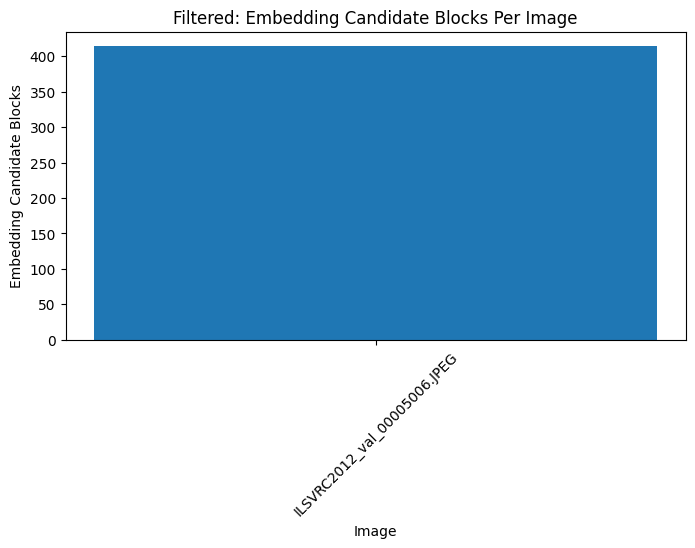

In [33]:
def visualize_filtered_embedding_candidates(filtered_candidates_per_image, filtered_titles):
    """
    Plot number of embedding candidate blocks for filtered images.

    Args:
        filtered_candidates_per_image (list): Filtered candidate data.
        filtered_titles (list): Titles for remaining images.
    """
    num_blocks = [len(candidates) for candidates in filtered_candidates_per_image]

    plt.figure(figsize=(8, 4))
    plt.bar(range(len(num_blocks)), num_blocks, tick_label=filtered_titles)
    plt.title("Filtered: Embedding Candidate Blocks Per Image")
    plt.xlabel("Image")
    plt.ylabel("Embedding Candidate Blocks")
    plt.xticks(rotation=45)
    plt.show()

# Show filtered candidate block counts
visualize_filtered_embedding_candidates(filtered_candidates_per_image, filtered_titles)



## Step 9: Embed Payload Bits into the Selected DCT Coefficients


#### Step 9 - tasks


- Embed your **payload bits** into the **mid-mid DCT coefficients** of each good block,  
  for each image that has embedding opportunities.

- Use the **4-8 QnT bandwidth** to guide **safe embedding**.

- Modify coefficients **gently**:
    - **LSB modification**  
    - Minimal **±1 tweak**

- Keep track of **how many bits** we’ve embedded per image.

- Prep for **reconstruction** in the next step (**inverse DCT**).


### Code Block #1: The Embed Function (Revised and Cleaned Up)


In [34]:
# def embed_bits_in_dct_blocks(dct_blocks_info, embedding_candidates, payload_bits, low_threshold=4, high_threshold=8):
#     """
#     Embed bits into the DCT coefficients of selected blocks for a single image.

#     Args:
#         dct_blocks_info (list): DCT blocks of the image (from Step 7).
#         embedding_candidates (list): Candidate blocks for embedding (from Step 8).
#         payload_bits (numpy array): The payload bitstream.
#         low_threshold (int): Minimum Q value for embedding.
#         high_threshold (int): Maximum Q value for embedding.

#     Returns:
#         modified_dct_blocks_info (list): Modified DCT blocks with embedded bits.
#         num_embedded_bits (int): Number of bits successfully embedded.
#     """
#     bit_idx = 0
#     max_bits = len(payload_bits)

#     # Make a deep copy so we don't modify the originals
#     import copy
#     modified_dct_blocks_info = copy.deepcopy(dct_blocks_info)

#     print(f"\nEmbedding up to {max_bits} bits in current image...")

#     for block in embedding_candidates:
#         block_position = block[0]['block_position']  # Same for all subblocks in this block group

#         for subblock_info in block:
#             subblock_idx = subblock_info['subblock_idx']
#             candidates = subblock_info['candidates']

#             # Reference to the actual DCT block we're modifying
#             dct_block = modified_dct_blocks_info[
#                 next((idx for idx, blk in enumerate(dct_blocks_info) if blk['block_position'] == block_position))
#             ]['dct_blocks'][subblock_idx]

#             for candidate in candidates:
#                 y, x = candidate['freq']
#                 q_value = candidate['q_value']

#                 # Only embed if QnT value is within bandwidth
#                 if low_threshold <= q_value <= high_threshold:
#                     if bit_idx >= max_bits:
#                         print("All payload bits embedded!")
#                         return modified_dct_blocks_info, bit_idx

#                     for channel in range(3):  # Embed into R, G, B channels
#                         coeff_int = int(round(dct_block[y, x, channel]))

#                         # Modify the LSB of the coefficient to embed the payload bit
#                         if coeff_int >= 0:
#                             new_coeff = (coeff_int & ~1) | payload_bits[bit_idx]
#                         else:
#                             new_coeff = -((abs(coeff_int) & ~1) | payload_bits[bit_idx])

#                         # Update the DCT block with the new coefficient
#                         dct_block[y, x, channel] = float(new_coeff)

#                         # Debug output (optional, can comment out later)
#                         print(f"Embedded bit {payload_bits[bit_idx]} at block {block_position}, subblock {subblock_idx}, freq ({y},{x}), channel {channel}, Q={q_value}")

#                         # Move to the next bit
#                         bit_idx += 1

#                         # Stop if we've embedded all bits
#                         if bit_idx >= max_bits:
#                             break

#                 else:
#                     print(f"Skipping freq ({y},{x}) due to Q={q_value}")

#             # Stop if we've embedded all bits
#             if bit_idx >= max_bits:
#                 break

#         if bit_idx >= max_bits:
#             break

#     print(f"Finished embedding {bit_idx} bits in this image.")
#     return modified_dct_blocks_info, bit_idx

In [35]:
def embed_bits_in_dct_blocks_8x8(dct_blocks_info, embedding_candidates, payload_bits, low_threshold=4, high_threshold=8):
    """
    Embed bits into DCT coefficients of 8x8 blocks.

    Args:
        dct_blocks_info (list): DCT blocks for a single image.
        embedding_candidates (list): List of embedding spots per block.
        payload_bits (numpy array): Bitstream to embed.
        low_threshold (int): Minimum Q value allowed.
        high_threshold (int): Maximum Q value allowed.

    Returns:
        modified_dct_blocks_info (list): DCT blocks with embedded payload.
        num_embedded_bits (int): Number of bits actually embedded.
    """
    bit_idx = 0
    max_bits = len(payload_bits)
    import copy
    modified_dct_blocks_info = copy.deepcopy(dct_blocks_info)

    print(f"\nEmbedding up to {max_bits} bits in current image...")

    for block_candidates in embedding_candidates:
        # Each block_candidates is a list of dicts with 'block_position', 'freq', 'q_value'
        if not block_candidates:
            continue

        block_position = block_candidates[0]['block_position']  # Same for all candidates in this block

        # Get the DCT block to modify
        block_idx = next((i for i, b in enumerate(modified_dct_blocks_info) if b['block_position'] == block_position), None)
        if block_idx is None:
            print(f"Warning: Block {block_position} not found.")
            continue

        dct_block = modified_dct_blocks_info[block_idx]['dct_block']

        for candidate in block_candidates:
            y, x = candidate['freq']
            q_value = candidate['q_value']

            if low_threshold <= q_value <= high_threshold:
                if bit_idx >= max_bits:
                    print("All payload bits embedded!")
                    return modified_dct_blocks_info, bit_idx

                for channel in range(3):  # R, G, B
                    coeff = int(round(dct_block[y, x, channel]))
                    if coeff >= 0:
                        new_coeff = (coeff & ~1) | payload_bits[bit_idx]
                    else:
                        new_coeff = -((abs(coeff) & ~1) | payload_bits[bit_idx])

                    dct_block[y, x, channel] = float(new_coeff)

                    print(f"Embedded bit {payload_bits[bit_idx]} at block {block_position}, freq ({y},{x}), channel {channel}, Q={q_value}")
                    bit_idx += 1

                    if bit_idx >= max_bits:
                        break

            else:
                print(f"Skipping freq ({y},{x}) due to Q={q_value}")

        if bit_idx >= max_bits:
            break

    print(f"Finished embedding {bit_idx} bits in this image.")
    return modified_dct_blocks_info, bit_idx


### Code Block #2: Loop Through All Images and Embed Payloads

In [36]:
# # Store modified DCT blocks after embedding
# modified_dct_blocks_per_image = []
# embedded_bits_per_image = []

# for idx in range(len(filtered_candidates_per_image)):
#     image_title = filtered_titles[idx]
#     payload_bits = filtered_payloads[idx]
#     num_payload_bits = len(payload_bits)
#     num_candidate_blocks = len(filtered_candidates_per_image[idx])
#     capacity_estimate = num_candidate_blocks * 4  # Since we're assuming 4 bits per block, adjust if needed

#     # Optional: if you originally used string_to_bits to create the payload, show the original string
#     # If you have it still available, otherwise this is just for show
#     try:
#         message_payload_str = ''.join([chr(int("".join(map(str, payload_bits[i:i+8])), 2)) for i in range(0, len(payload_bits), 8)])
#     except:
#         message_payload_str = "[Not a valid string - likely random bits]"

#     print("\n" + "=" * 60)
#     print(f"=== Embedding in Image {idx+1}: {image_title} ===")
#     print("=" * 60)
#     print(f"Original Payload String: {message_payload_str}")
#     print(f"Converted Payload Bits: {''.join(map(str, payload_bits.tolist()))}")
#     print(f"Number of Bits in Payload: {num_payload_bits}")
#     print(f"Available Candidate Blocks: {num_candidate_blocks}")
#     print(f"Estimated Capacity (blocks x bits per block): {capacity_estimate} bits")
#     print(f"Using Bandwidth Threshold: Low=4, High=8")
#     print("=" * 60)

#     modified_dct_blocks, num_embedded_bits = embed_bits_in_dct_blocks(
#         dct_blocks_info=filtered_dct_blocks_per_image[idx],
#         embedding_candidates=filtered_candidates_per_image[idx],
#         payload_bits=payload_bits,
#         low_threshold=4,
#         high_threshold=8
#     )

#     modified_dct_blocks_per_image.append(modified_dct_blocks)
#     embedded_bits_per_image.append(num_embedded_bits)

#     print(f"\nDone Embedding in Image {idx+1}: {image_title}")
#     print(f"Total Bits Embedded: {num_embedded_bits}/{num_payload_bits} bits")
#     print("=" * 60 + "\n")


In [37]:
# Store modified DCT blocks after embedding
modified_dct_blocks_per_image = []
embedded_bits_per_image = []

for idx in range(len(filtered_candidates_per_image)):
    image_title = filtered_titles[idx]
    payload_bits = filtered_payloads[idx]
    num_payload_bits = len(payload_bits)
    num_candidate_blocks = len(filtered_candidates_per_image[idx])
    
    # Estimate capacity based on actual candidate frequency slots
    capacity_estimate = sum([len(block_candidates) for block_candidates in filtered_candidates_per_image[idx]])

    try:
        message_payload_str = ''.join([chr(int("".join(map(str, payload_bits[i:i+8])), 2)) for i in range(0, len(payload_bits), 8)])
    except:
        message_payload_str = "[Not a valid string - likely random bits]"

    print("\n" + "=" * 60)
    print(f"=== Embedding in Image {idx+1}: {image_title} ===")
    print("=" * 60)
    print(f"Original Payload String: {message_payload_str}")
    print(f"Converted Payload Bits: {''.join(map(str, payload_bits.tolist()))}")
    print(f"Number of Bits in Payload: {num_payload_bits}")
    print(f"Available Candidate Blocks: {num_candidate_blocks}")
    print(f"Estimated Capacity (sum of candidate frequencies): {capacity_estimate} bits")
    print(f"Using Bandwidth Threshold: Low=4, High=8")
    print("=" * 60)

    modified_dct_blocks, num_embedded_bits = embed_bits_in_dct_blocks_8x8(
        dct_blocks_info=filtered_dct_blocks_per_image[idx],
        embedding_candidates=filtered_candidates_per_image[idx],
        payload_bits=payload_bits,
        low_threshold=4,
        high_threshold=8
    )

    modified_dct_blocks_per_image.append(modified_dct_blocks)
    embedded_bits_per_image.append(num_embedded_bits)

    print(f"\nDone Embedding in Image {idx+1}: {image_title}")
    print(f"Total Bits Embedded: {num_embedded_bits}/{num_payload_bits} bits")
    print("=" * 60 + "\n")



=== Embedding in Image 1: ILSVRC2012_val_00005006.JPEG ===
Original Payload String: War Eagle!
Converted Payload Bits: 01010111011000010111001000100000010001010110000101100111011011000110010100100001
Number of Bits in Payload: 80
Available Candidate Blocks: 414
Estimated Capacity (sum of candidate frequencies): 1242 bits
Using Bandwidth Threshold: Low=4, High=8

Embedding up to 80 bits in current image...
Embedded bit 0 at block (0, 0), freq (3,3), channel 0, Q=6
Embedded bit 1 at block (0, 0), freq (3,3), channel 1, Q=6
Embedded bit 0 at block (0, 0), freq (3,3), channel 2, Q=6
Embedded bit 1 at block (0, 0), freq (2,3), channel 0, Q=5
Embedded bit 0 at block (0, 0), freq (2,3), channel 1, Q=5
Embedded bit 1 at block (0, 0), freq (2,3), channel 2, Q=5
Embedded bit 1 at block (0, 0), freq (1,4), channel 0, Q=5
Embedded bit 1 at block (0, 0), freq (1,4), channel 1, Q=5
Embedded bit 0 at block (0, 0), freq (1,4), channel 2, Q=5
Embedded bit 1 at block (0, 1), freq (3,3), channel 0, Q=6


### Code Block #3: Visual Check / Summary of Embedding

In [38]:
# Summary of embedding per image
for idx, num_bits in enumerate(embedded_bits_per_image):
    print(f"Image {idx+1}: {filtered_titles[idx]} - {num_bits} bits embedded.")


Image 1: ILSVRC2012_val_00005006.JPEG - 80 bits embedded.


## Step 10: Inverse DCT and Reconstruct the Stego Images

### Code Block #1: Helper Function to Rebuild 16x16 Blocks from Modified DCT Blocks

In [39]:
def dct_block_to_spatial_block_8x8(dct_block):
    """
    Perform inverse DCT on a single 8x8x3 DCT block.

    Args:
        dct_block (numpy array): 8x8x3 DCT block.

    Returns:
        spatial_block (numpy array): 8x8x3 spatial block (uint8).
    """
    spatial_block = np.zeros_like(dct_block, dtype=np.float32)

    for c in range(3):  # For each RGB channel
        spatial_block[:, :, c] = cv2.idct(dct_block[:, :, c])

    # Clip values and convert to uint8 for image display
    spatial_block = np.clip(spatial_block, 0, 255).astype(np.uint8)
    return spatial_block


### Code Block #2: Reconstruct the Entire Image From Modified Blocks

In [40]:
def reconstruct_image_from_dct_blocks_8x8(original_image, modified_dct_blocks_info, block_size=8):
    """
    Reconstruct the stego image from modified 8x8 DCT blocks.

    Args:
        original_image (numpy array): The original RGB image (uint8).
        modified_dct_blocks_info (list): List of modified DCT blocks (with 'block_position' and 'dct_block').
        block_size (int): Block size (default 8).

    Returns:
        reconstructed_image (numpy array): The stego image reconstructed from DCT blocks.
    """
    reconstructed_image = original_image.copy()

    for block_info in modified_dct_blocks_info:
        block_position = block_info['block_position']
        dct_block = block_info['dct_block']

        # Inverse DCT to get spatial block
        spatial_block = dct_block_to_spatial_block_8x8(dct_block)

        # Map it back to the image
        y_start = block_position[0] * block_size
        x_start = block_position[1] * block_size

        reconstructed_image[y_start:y_start+block_size, x_start:x_start+block_size, :] = spatial_block

    return reconstructed_image


### Code Block #3: Reconstruct and Display Stego Images Side by Side

In [41]:
def display_original_and_stego_images_8x8(filtered_sample_images, reconstructed_images, filtered_titles):
    """
    Display original and stego images side by side for visual comparison.

    Args:
        filtered_sample_images (list): List of original RGB images (normalized or uint8).
        reconstructed_images (list): List of reconstructed stego RGB images (uint8).
        filtered_titles (list): List of titles for each image.
    """
    num_images = len(filtered_sample_images)
    fig, axes = plt.subplots(2, num_images, figsize=(num_images * 4, 8))

    if num_images == 1:
        axes = np.array(axes).reshape(2, 1)

    for i in range(num_images):
        # Normalize if needed
        original_img = (filtered_sample_images[i] * 255).astype(np.uint8) if filtered_sample_images[i].max() <= 1.0 else filtered_sample_images[i]
        stego_img = reconstructed_images[i]

        axes[0, i].imshow(original_img)
        axes[0, i].set_title(f"Original: {filtered_titles[i]}")
        axes[0, i].axis('off')

        axes[1, i].imshow(stego_img)
        axes[1, i].set_title(f"Stego: {filtered_titles[i]}")
        axes[1, i].axis('off')

    plt.tight_layout()
    plt.show()


### Code Block #4: Reconstruct Images and Run the Display

In [42]:
def load_filtered_images_8x8(filtered_image_paths, target_size=(224, 224)):
    """
    Load and preprocess filtered images from file paths.

    Args:
        filtered_image_paths (list): List of image file paths.
        target_size (tuple): Resize dimensions, default (224, 224).

    Returns:
        filtered_sample_images (list): List of normalized RGB images.
    """
    filtered_sample_images = []

    for path in filtered_image_paths:
        img = Image.open(path).convert("RGB")
        img = img.resize(target_size)
        img_array = np.array(img) / 255.0  # Normalize to [0,1]
        filtered_sample_images.append(img_array)

    print(f"✅ Loaded and preprocessed {len(filtered_sample_images)} images at size {target_size}")
    return filtered_sample_images

filtered_sample_images = load_filtered_images_8x8(filtered_sample_image_paths)


✅ Loaded and preprocessed 1 images at size (224, 224)


Reconstructing Image 1: ILSVRC2012_val_00005006.JPEG


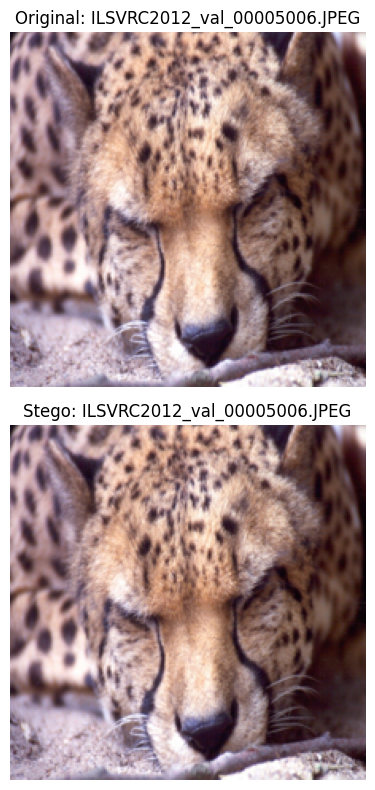

In [43]:
reconstructed_images = []

for idx in range(len(filtered_dct_blocks_per_image)):
    print(f"Reconstructing Image {idx+1}: {filtered_titles[idx]}")

    # Get original image (uint8) from normalized if needed
    original_img = (filtered_sample_images[idx] * 255).astype(np.uint8) if filtered_sample_images[idx].max() <= 1.0 else filtered_sample_images[idx]

    # Reconstruct stego image using 8x8 block-based function
    stego_img = reconstruct_image_from_dct_blocks_8x8(
        original_image=original_img,
        modified_dct_blocks_info=modified_dct_blocks_per_image[idx]
    )

    reconstructed_images.append(stego_img)

# Display side-by-side comparison
display_original_and_stego_images_8x8(filtered_sample_images, reconstructed_images, filtered_titles)


## Step 11: Evaluate Image Quality - PSNR & SSIM & MSE

### Code Block #1: Setup PSNR & SSIM Functions

In [44]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import numpy as np

def evaluate_stego_images(filtered_sample_images, reconstructed_images, filtered_titles):
    """
    Evaluate PSNR, SSIM, and MSE between original and stego images.

    Args:
        filtered_sample_images (list): List of original images (normalized RGB arrays).
        reconstructed_images (list): List of reconstructed stego images (uint8).
        filtered_titles (list): Titles for each image.

    Returns:
        evaluation_results (list): List of dicts with PSNR, SSIM, and MSE per image.
    """
    evaluation_results = []

    for idx in range(len(filtered_sample_images)):
        # Prepare original and stego images in uint8
        original_img = (filtered_sample_images[idx] * 255).astype(np.uint8) if filtered_sample_images[idx].max() <= 1.0 else filtered_sample_images[idx]
        stego_img = reconstructed_images[idx]

        # PSNR (computed on full RGB images)
        psnr_value = psnr(original_img, stego_img, data_range=255)

        # SSIM (computed on full RGB images)
        ssim_value = ssim(
            original_img,
            stego_img,
            channel_axis=-1,   # Instead of multichannel=True
            data_range=255
        )

        # MSE (Mean Squared Error)
        mse_value = np.mean((original_img.astype("float32") - stego_img.astype("float32")) ** 2)

        result = {
            "Image": filtered_titles[idx],
            "PSNR (dB)": round(psnr_value, 2),
            "SSIM": round(ssim_value, 4),
            "MSE": round(mse_value, 4)
        }

        evaluation_results.append(result)

        print(f"Evaluated {filtered_titles[idx]} --> PSNR: {result['PSNR (dB)']} dB, SSIM: {result['SSIM']}, MSE: {result['MSE']}")

    return evaluation_results


### Code Block #2: Run Evaluation on Your Images

In [45]:
evaluation_results = evaluate_stego_images(filtered_sample_images, reconstructed_images, filtered_titles)


Evaluated ILSVRC2012_val_00005006.JPEG --> PSNR: 61.66 dB, SSIM: 0.9999, MSE: 0.04439999908208847


### Code Block #3: Visualize The Scores


In [46]:
import pandas as pd

def display_evaluation_results(evaluation_results):
    """
    Display the evaluation results in a table.

    Args:
        evaluation_results (list): List of dicts with evaluation data.
    """
    df = pd.DataFrame(evaluation_results)
    display(df)

# Show PSNR and SSIM results table
display_evaluation_results(evaluation_results)


,Image,PSNR (dB),SSIM,MSE
0,ILSVRC2012_val_00005006.JPEG,61.66,0.9999,0.0444


###   Code Block: Save Stego Images (PNG or JPEG)

In [47]:
def save_original_and_stego_images(filtered_sample_images, reconstructed_images, filtered_titles, save_dir="image_outputs", format="jpeg", jpeg_quality=90):
    """
    Save both original and stego images to a directory in the specified format.

    Args:
        filtered_sample_images (list): List of original images (normalized RGB arrays).
        reconstructed_images (list): List of stego images (uint8).
        filtered_titles (list): Image titles to use as filenames.
        save_dir (str): Directory to save images.
        format (str): Image format ('png' for lossless, 'jpeg' for lossy).
        jpeg_quality (int): Quality for JPEG images (1-100).
    """
    import os
    from PIL import Image

    originals_dir = os.path.join(save_dir, "originals")
    stegos_dir = os.path.join(save_dir, "stegos")

    # Create directories if they don't exist
    os.makedirs(originals_dir, exist_ok=True)
    os.makedirs(stegos_dir, exist_ok=True)

    for idx, (original_img, stego_img) in enumerate(zip(filtered_sample_images, reconstructed_images)):
        # Prepare original image (convert back to uint8 if needed)
        original_img_uint8 = (original_img * 255).astype(np.uint8) if original_img.max() <= 1.0 else original_img

        # Convert to PIL Images
        orig_pil = Image.fromarray(original_img_uint8)
        stego_pil = Image.fromarray(stego_img)

        # Get base filename (strip file extension)
        base_name = os.path.splitext(filtered_titles[idx])[0]

        # File paths
        orig_file = os.path.join(originals_dir, f"{base_name}_original.{format}")
        stego_file = os.path.join(stegos_dir, f"{base_name}_stego.{format}")

        # Save original
        if format.lower() == "jpeg":
            orig_pil.save(orig_file, "JPEG", quality=jpeg_quality)
        else:
            orig_pil.save(orig_file)

        # Save stego
        if format.lower() == "jpeg":
            stego_pil.save(stego_file, "JPEG", quality=jpeg_quality)
        else:
            stego_pil.save(stego_file)

        print(f"Saved Original Image: {orig_file}")
        print(f"Saved Stego Image: {stego_file}")

# Run it - save PNGs (or JPEGs if you like)
save_original_and_stego_images(filtered_sample_images, reconstructed_images, filtered_titles, save_dir="image_outputs", format="jpeg")  # or "jpeg"


Saved Original Image: image_outputs/originals/ILSVRC2012_val_00005006_original.jpeg
Saved Stego Image: image_outputs/stegos/ILSVRC2012_val_00005006_stego.jpeg
